In [5]:
import pandas as pd

# Load your dataset
data = pd.read_csv("Coca-Cola_stock_history.csv")
data.head()


,Date,Open,High,Low,Close,Volume,Dividends,Stock Splits
0,02-01-1962,0.050016,0.051378,0.050016,0.050016,806400,0.0,0
1,03-01-1962,0.049273,0.049273,0.048159,0.048902,1574400,0.0,0
2,04-01-1962,0.049026,0.049645,0.049026,0.049273,844800,0.0,0
3,05-01-1962,0.049273,0.049892,0.048035,0.048159,1420800,0.0,0
4,08-01-1962,0.047787,0.047787,0.046735,0.047664,2035200,0.0,0


In [6]:
data.info()
data.isnull().sum()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15311 entries, 0 to 15310
Data columns (total 8 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Date          15311 non-null  object 
 1   Open          15311 non-null  float64
 2   High          15311 non-null  float64
 3   Low           15311 non-null  float64
 4   Close         15311 non-null  float64
 5   Volume        15311 non-null  int64  
 6   Dividends     15311 non-null  float64
 7   Stock Splits  15311 non-null  int64  
dtypes: float64(5), int64(2), object(1)
memory usage: 957.1+ KB


Date            0
Open            0
High            0
Low             0
Close           0
Volume          0
Dividends       0
Stock Splits    0
dtype: int64

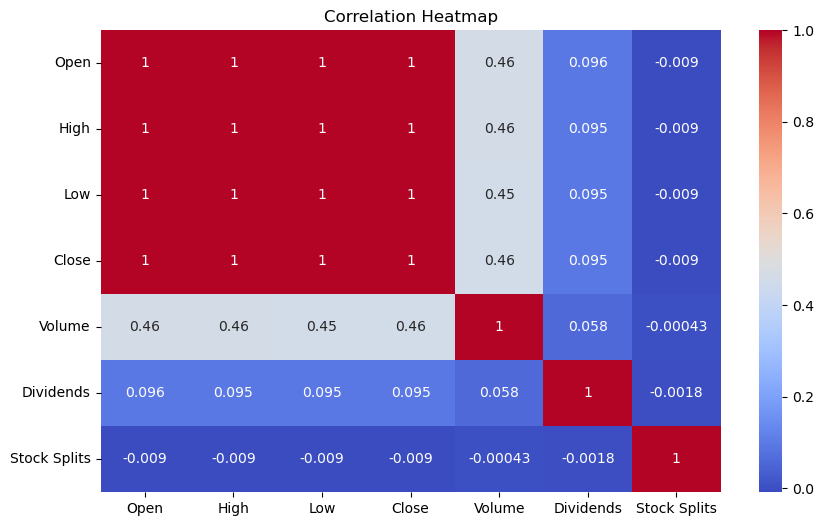

In [7]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(10,6))
sns.heatmap(data.corr(numeric_only=True), annot=True, cmap='coolwarm')
plt.title('Correlation Heatmap')
plt.show()


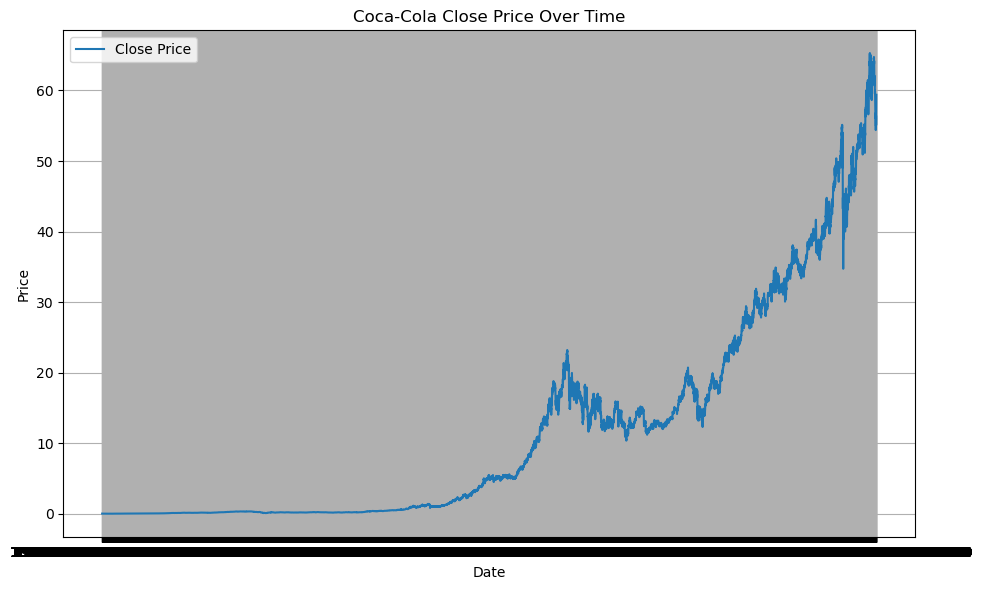

In [9]:
plt.figure(figsize=(10,6))
plt.plot(data['Date'], data['Close'], label='Close Price')
plt.xlabel('Date')
plt.ylabel('Price')
plt.title('Coca-Cola Close Price Over Time')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


In [10]:
data['MA_20'] = data['Close'].rolling(window=20).mean()
data['MA_50'] = data['Close'].rolling(window=50).mean()
data['Daily_Return'] = data['Close'].pct_change()
data = data.dropna()


In [11]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error

# Features and target
features = ['Open', 'High', 'Low', 'Volume', 'MA_20', 'MA_50', 'Daily_Return']
target = 'Close'

X = data[features]
y = data[target]

# Split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=False)

# Model
model = RandomForestRegressor()
model.fit(X_train, y_train)

# Predict and Evaluate
y_pred = model.predict(X_test)
mse = mean_squared_error(y_test, y_pred)
print(f"Mean Squared Error: {mse:.2f}")


Mean Squared Error: 328.12


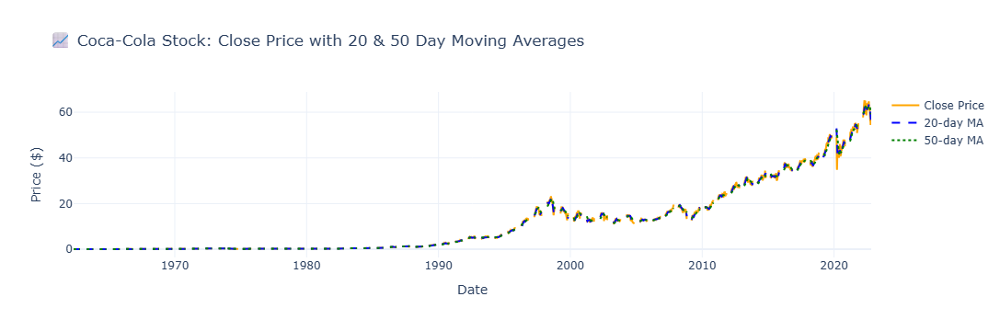

In [12]:
import plotly.graph_objects as go

fig = go.Figure()

# Close Price
fig.add_trace(go.Scatter(
    x=data['Date'], y=data['Close'],
    mode='lines',
    name='Close Price',
    line=dict(color='orange')
))

# 20-day Moving Average
fig.add_trace(go.Scatter(
    x=data['Date'], y=data['MA_20'],
    mode='lines',
    name='20-day MA',
    line=dict(dash='dash', color='blue')
))

# 50-day Moving Average
fig.add_trace(go.Scatter(
    x=data['Date'], y=data['MA_50'],
    mode='lines',
    name='50-day MA',
    line=dict(dash='dot', color='green')
))

fig.update_layout(
    title='📈 Coca-Cola Stock: Close Price with 20 & 50 Day Moving Averages',
    xaxis_title='Date',
    yaxis_title='Price ($)',
    template='plotly_white',
    hovermode='x unified'
)

fig.show()


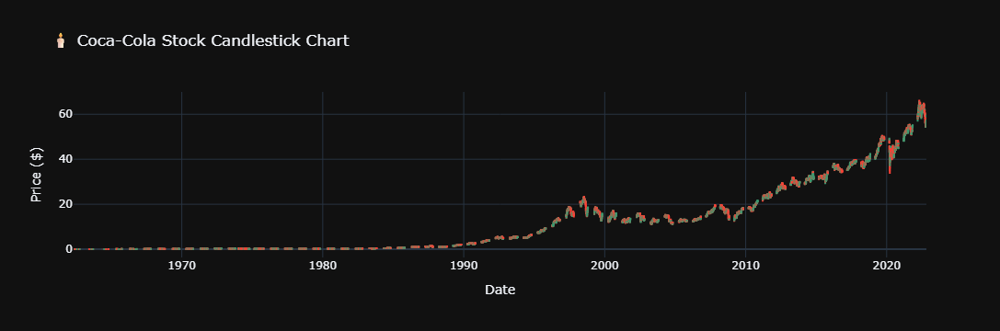

In [13]:
import plotly.graph_objects as go

fig = go.Figure(data=[go.Candlestick(
    x=data['Date'],
    open=data['Open'],
    high=data['High'],
    low=data['Low'],
    close=data['Close'],
    name="Candlestick")])

fig.update_layout(
    title='🕯️ Coca-Cola Stock Candlestick Chart',
    xaxis_title='Date',
    yaxis_title='Price ($)',
    xaxis_rangeslider_visible=False,
    template='plotly_dark'
)
fig.show()


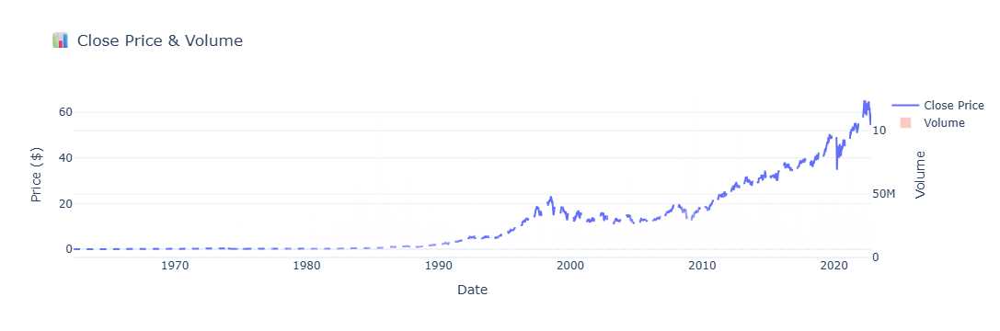

In [14]:
fig = go.Figure()

fig.add_trace(go.Scatter(x=data['Date'], y=data['Close'],
                         name='Close Price', yaxis='y1'))
fig.add_trace(go.Bar(x=data['Date'], y=data['Volume'],
                     name='Volume', yaxis='y2', opacity=0.3))

fig.update_layout(
    title='📊 Close Price & Volume',
    yaxis=dict(title='Price ($)', side='left'),
    yaxis2=dict(title='Volume', overlaying='y', side='right'),
    xaxis_title='Date',
    template='plotly_white'
)
fig.show()


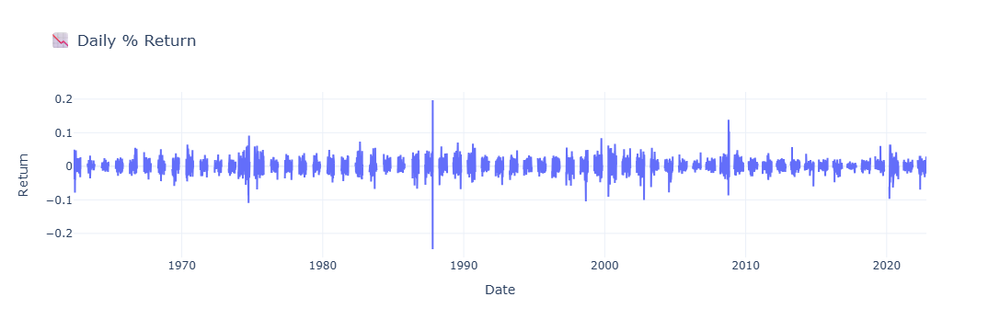

In [15]:
data['Daily_Return'] = data['Close'].pct_change()

fig = go.Figure()
fig.add_trace(go.Scatter(x=data['Date'], y=data['Daily_Return'],
                         mode='lines', name='Daily Return'))

fig.update_layout(title='📉 Daily % Return',
                  xaxis_title='Date', yaxis_title='Return',
                  template='plotly_white')
fig.show()


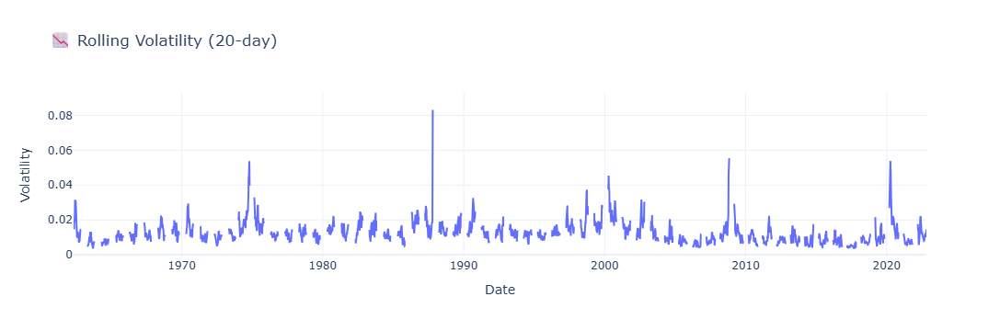

In [16]:
data['Volatility'] = data['Daily_Return'].rolling(window=20).std()

fig = go.Figure()
fig.add_trace(go.Scatter(x=data['Date'], y=data['Volatility'],
                         name='20-day Rolling Volatility'))

fig.update_layout(title='📉 Rolling Volatility (20-day)',
                  xaxis_title='Date', yaxis_title='Volatility',
                  template='plotly_white')
fig.show()


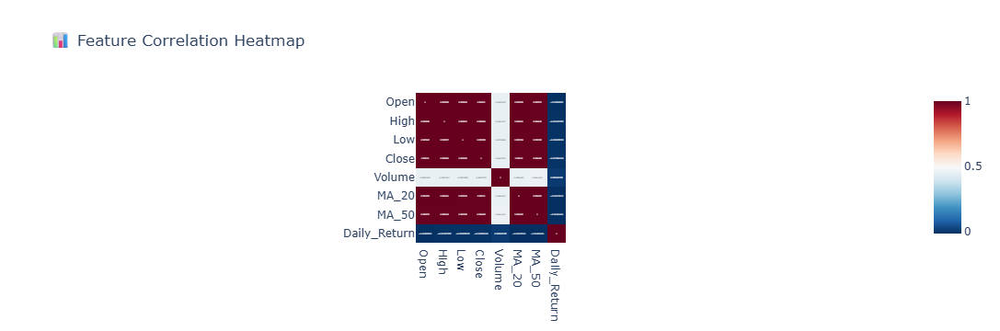

In [17]:
import plotly.express as px

corr_cols = ['Open', 'High', 'Low', 'Close', 'Volume', 'MA_20', 'MA_50', 'Daily_Return']
fig = px.imshow(data[corr_cols].corr(),
                text_auto=True,
                title='📊 Feature Correlation Heatmap',
                color_continuous_scale='RdBu_r')
fig.show()


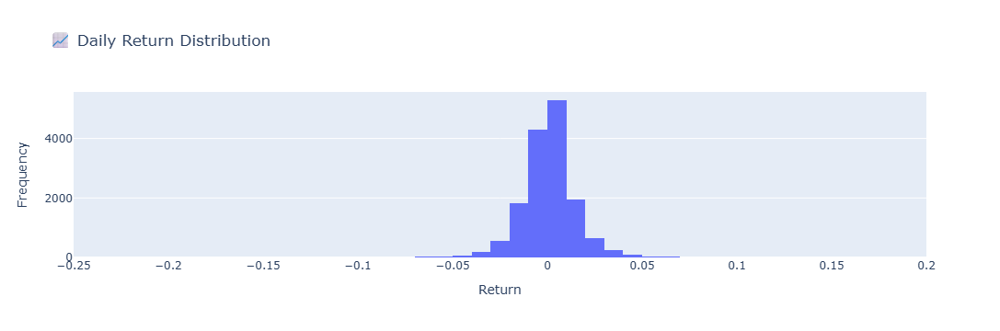

In [18]:
fig = px.histogram(data, x='Daily_Return', nbins=50, title='📈 Daily Return Distribution')
fig.update_layout(xaxis_title='Return', yaxis_title='Frequency')
fig.show()


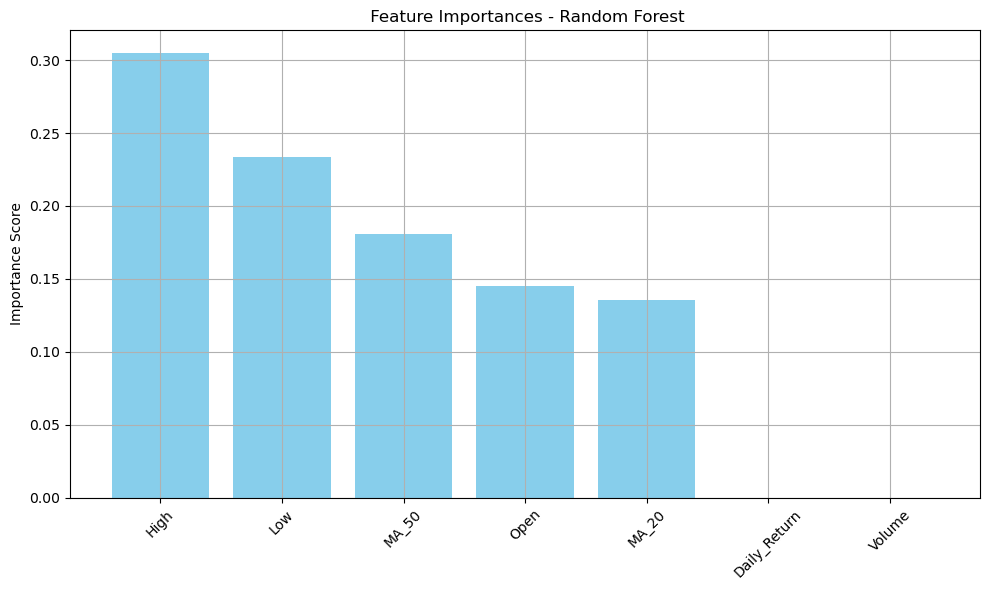

In [20]:
# Import libraries
import numpy as np
import matplotlib.pyplot as plt

# Get feature importances
importances = model.feature_importances_
feature_names = X.columns

# Sort by importance
indices = np.argsort(importances)[::-1]

# Plot
plt.figure(figsize=(10, 6))
    plt.title(" Feature Importances - Random Forest")
plt.bar(range(len(importances)), importances[indices], align="center", color='skyblue')
plt.xticks(range(len(importances)), feature_names[indices], rotation=45)
plt.ylabel("Importance Score")
plt.tight_layout()
plt.grid(True)
plt.show()
